In [23]:
import torch
import torch.nn as nn
import torch.optim as optim
from Dataloader import load_data
from CNN import SimpleCNN
from torchvision.utils import save_image
import os
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

# Train one image 

In [24]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
train_loader, _, _ = load_data(batch_size=1)

In [4]:
model = SimpleCNN().to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [5]:
print("Training on a single image:")
single_image = next(iter(train_loader))
gray, color = single_image
gray, color = gray.to(device), color.to(device)

Training on a single image:


In [6]:
model.train()
for iteration in range(5):  # Train for 5 iterations
    optimizer.zero_grad()
    outputs = model(gray)
    loss = criterion(outputs, color)
    loss.backward()
    optimizer.step()
    print(f"Iteration [{iteration + 1}/5], Loss: {loss.item():.4f}")

Iteration [1/5], Loss: 0.0471
Iteration [2/5], Loss: 0.0457
Iteration [3/5], Loss: 0.0443
Iteration [4/5], Loss: 0.0427
Iteration [5/5], Loss: 0.0408


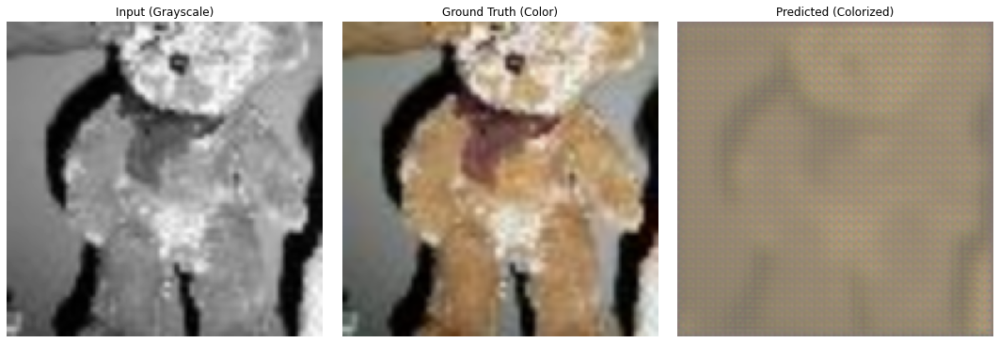

In [9]:
def visualize_results(gray, color, outputs, num_images=1):
    """
    Visualize the grayscale input, ground truth, and predicted colorization.
    """
    gray = gray.cpu().numpy()
    color = color.cpu().numpy()
    outputs = outputs.cpu().detach().numpy()
    
    fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))
    if num_images == 1:
        axes = [axes]  # Make it iterable for one image

    for i in range(num_images):
        # Grayscale Input
        axes[i][0].imshow(gray[i][0], cmap='gray')
        axes[i][0].set_title("Input (Grayscale)")
        axes[i][0].axis('off')

        # Ground Truth (Original Color)
        axes[i][1].imshow(np.transpose(color[i], (1, 2, 0)))
        axes[i][1].set_title("Ground Truth (Color)")
        axes[i][1].axis('off')

        # Predicted Output
        axes[i][2].imshow(np.transpose(outputs[i], (1, 2, 0)))
        axes[i][2].set_title("Predicted (Colorized)")
        axes[i][2].axis('off')

    plt.tight_layout()
    plt.show()

# Single image prediction and visualization
model.eval()
with torch.no_grad():
    outputs = model(gray)  # Predict on the single grayscale input

visualize_results(gray, color, outputs, num_images=1)

After this we added Data Augmentation and started training 

In [25]:
train_loader, val_loader, test_loader = load_data(batch_size=32)

In [26]:
print("Train set:", len(train_loader))
print("Val set:", len(val_loader))
print("Test set:", len(test_loader))


Train set: 2188
Val set: 625
Test set: 313


In [27]:
model = SimpleCNN().to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [28]:
os.makedirs("models", exist_ok=True)
os.makedirs("outputs", exist_ok=True)

In [29]:
epochs = 20
best_val_loss = float('inf')

In [30]:
def train_one_epoch(model, train_loader, criterion, optimizer, device):
    model.train()
    train_loss = 0
    for gray, color in train_loader:
        gray, color = gray.to(device), color.to(device)
        optimizer.zero_grad()
        outputs = model(gray)
        loss = criterion(outputs, color)
        loss.backward()
        optimizer.step()
        train_loss += loss.item()
    train_loss /= len(train_loader)
    return train_loss

In [31]:
def validate_one_epoch(model, val_loader, criterion, device):
    model.eval()
    val_loss = 0
    with torch.no_grad():
        for gray, color in val_loader:
            gray, color = gray.to(device), color.to(device)
            outputs = model(gray)
            loss = criterion(outputs, color)
            val_loss += loss.item()
    val_loss /= len(val_loader)
    return val_loss


Please note that here we are only training for 4 epochs because of my computer's limitations and lack of GPU. That is why in visualizing part I changed modularity to 5 to 1, so changing back will be easier. The number of epochs was supposed to be 20. IN best case scenario, training should be done with those parameters on AUA's servers. 

Start of training of epoch  1
Epoch [1/4], Train Loss: 0.0089
Start of validating of epoch  1
Epoch [1/4], Val Loss: 0.0079
Saved best model with Val Loss: 0.0079


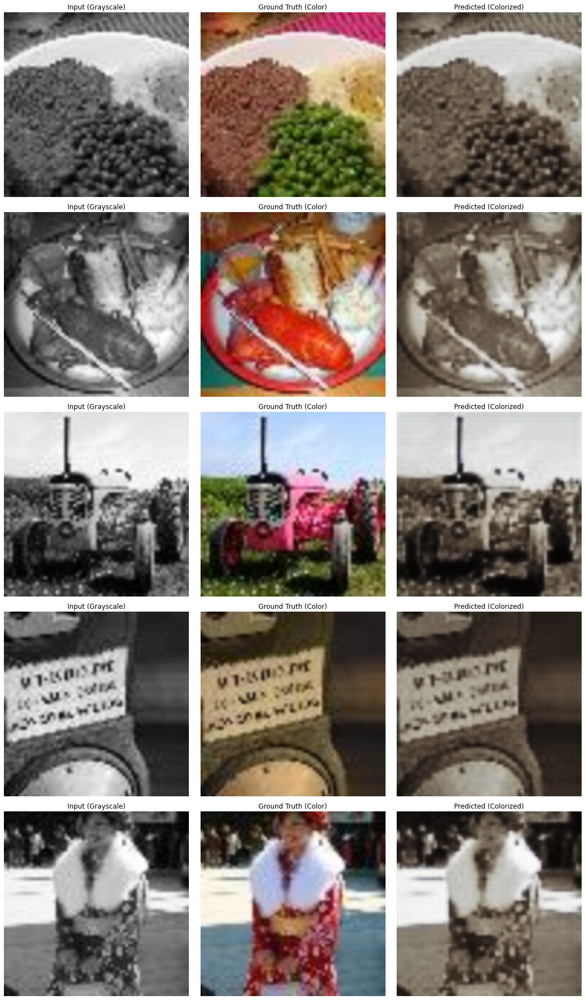

Start of training of epoch  2
Epoch [2/4], Train Loss: 0.0079
Start of validating of epoch  2
Epoch [2/4], Val Loss: 0.0078
Saved best model with Val Loss: 0.0078


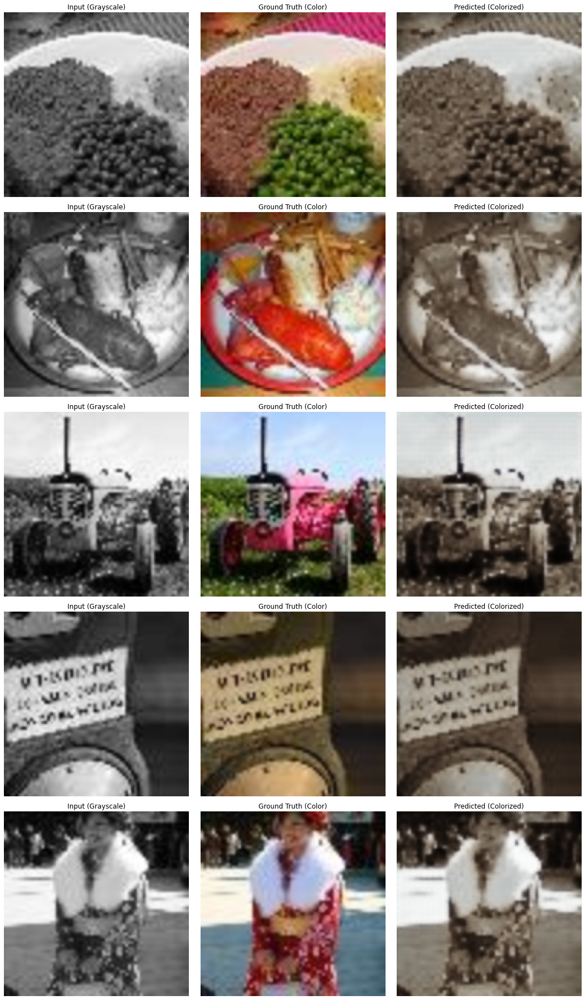

Start of training of epoch  3
Epoch [3/4], Train Loss: 0.0078
Start of validating of epoch  3
Epoch [3/4], Val Loss: 0.0076
Saved best model with Val Loss: 0.0076


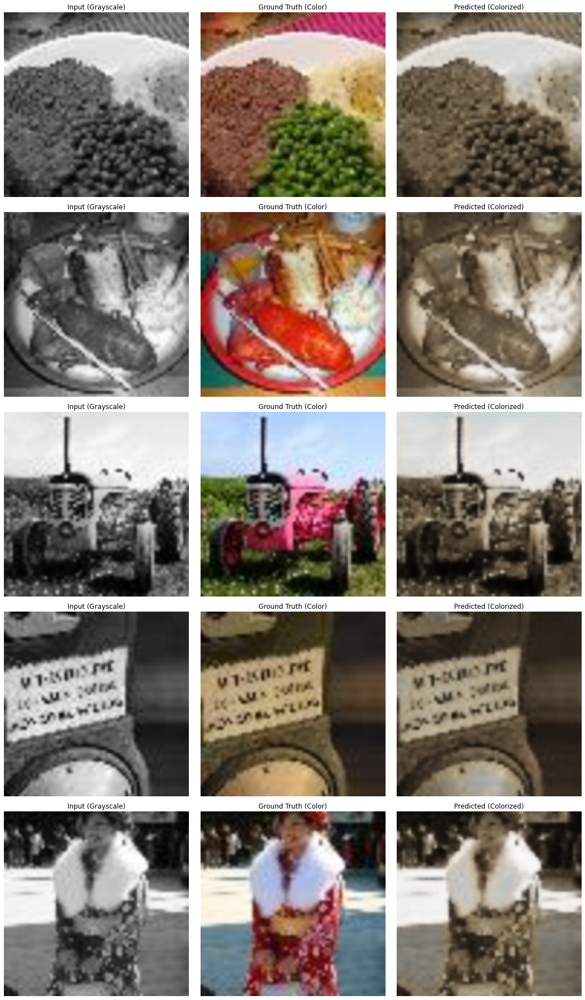

Start of training of epoch  4
Epoch [4/4], Train Loss: 0.0077
Start of validating of epoch  4
Epoch [4/4], Val Loss: 0.0075
Saved best model with Val Loss: 0.0075


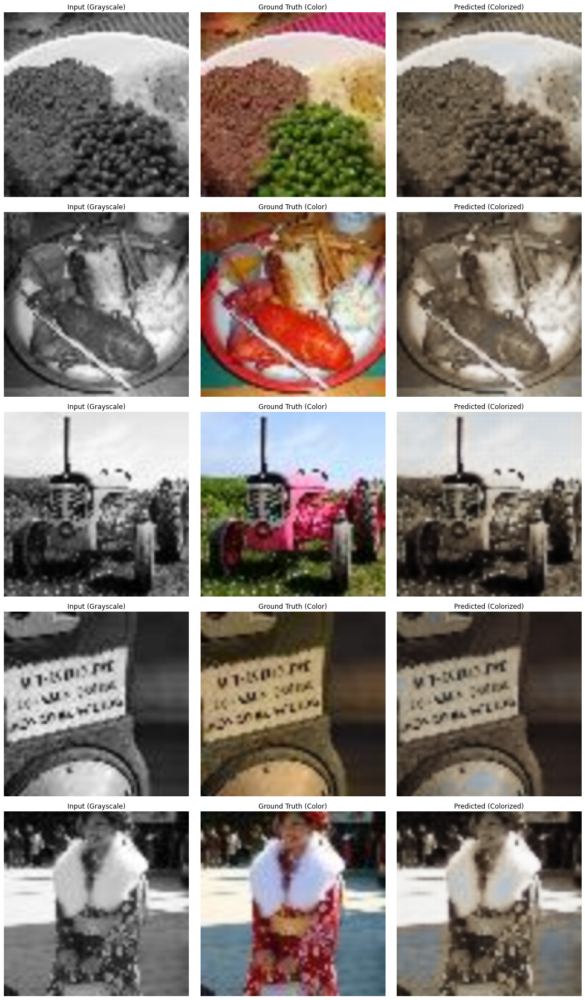

In [32]:
epochs = 4
for epoch in range(epochs):
    # Train for one epoch
    print("Start of training of epoch ", epoch+1)
    train_loss = train_one_epoch(model, train_loader, criterion, optimizer, device)
    print(f"Epoch [{epoch + 1}/{epochs}], Train Loss: {train_loss:.4f}")

    # Validate after each epoch
    print("Start of validating of epoch ", epoch+1)
    val_loss = validate_one_epoch(model, val_loader, criterion, device)
    print(f"Epoch [{epoch + 1}/{epochs}], Val Loss: {val_loss:.4f}")

    # Save the best model
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), "models/best_model.pth")
        print(f"Saved best model with Val Loss: {best_val_loss:.4f}")

    # Save intermediate outputs every 5 epochs
    if (epoch + 1) % 1 == 0:
        gray, color = next(iter(val_loader))
        gray, color = gray.to(device), color.to(device)
        with torch.no_grad():
            outputs = model(gray)
        visualize_results(gray, color, outputs, num_images=5)


Testing the model on the test dataset...
Test Loss: 0.0078

Visualizing test results...


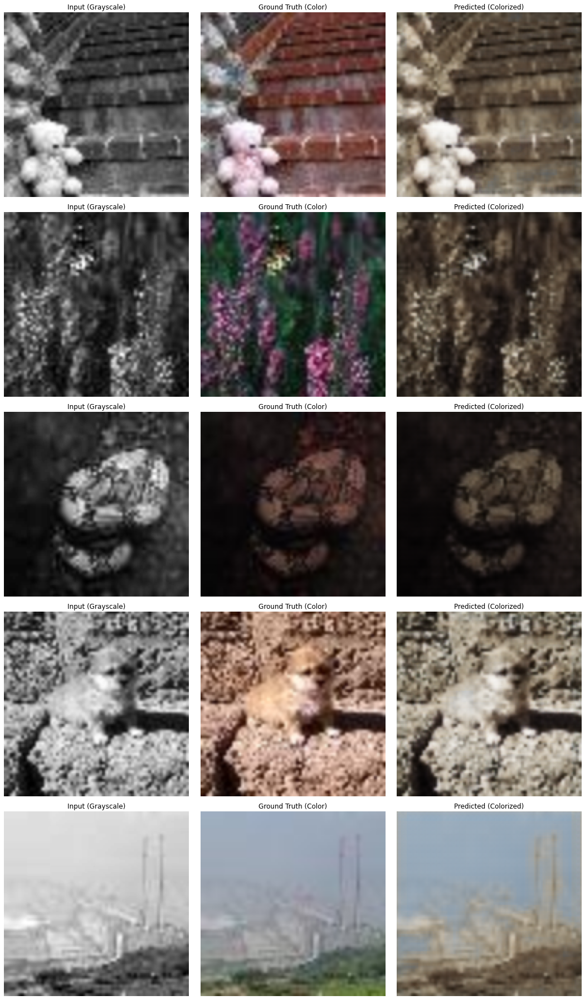

In [33]:
print("\nTesting the model on the test dataset...")
model.load_state_dict(torch.load("models/best_model.pth"))  # Load the best model
model.eval()
test_loss = 0
with torch.no_grad():
    for gray, color in test_loader:
        gray, color = gray.to(device), color.to(device)
        outputs = model(gray)
        loss = criterion(outputs, color)
        test_loss += loss.item()

test_loss /= len(test_loader)
print(f"Test Loss: {test_loss:.4f}")

# Visualize test results
print("\nVisualizing test results...")
gray, color = next(iter(test_loader))
gray, color = gray.to(device), color.to(device)
with torch.no_grad():
    outputs = model(gray)
visualize_results(gray, color, outputs, num_images=5)